#Mounting Google Drive

In [ ]:
'''
Mounting => Before your computer can use any kind of storage device (such as hard drive, Google drive), you or your operating system must make it
accessible through the computer’s file system. This process is called mounting. You can only access files on mounted media.
In Computers, to mount is to make a group of files in a file system structure accessible to a user or user group. In some usages, it means to make a
device physically accessible. Mounting a file system (Google drive) attaches that Google drive to a directory (mount  point) and makes it available to the
system. In simple words, with mounting a Google drive, user and operating system can access to all the files present in the Google drive. A mounted disk 
(a mounted drive) is available to the operating system as a file system, for reading, writing, or both.
'''
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Importing the required libraries

In [1]:
'''
Python library = python library is the collection of modules(= python files) and this python library is the reusable(=able to use again) chunk(= part, section
, block) of code we want to include in our python programs or projects to make the implementation easier and faster.

os module in python provides functions for interacting with the operating system. os module in Python provides functions for creating and removing a 
directory(folder), fetching its contents, os module used for changing and identifying the current directory, etc. Basically os module allows source code
to communicate (interact) with operating system.

numpy module allows us to work with numerical data. numpy provides an object called numpy array. numpy supports large multi-dimensional arrays & matrices. 
Basically numpy is a python library used for working with arrays. numpy used for arithmetic operations, statistical operations, bitwise operations, copying 
and viewing arrays, stacking, matrix operations, linear algebra, mathematical operations, searching, sorting, and counting.

pywt library used to perform wavelet transform (both Continuous Wavelet Transform (CWT) and Discrete Wavelet Transform (DWT)). This pywt library is a 
package of various wavelets of CWT and DWT (pywt library contains different wavelets of CWT and DWT) to perform wavelet transform.

pandas library is used for data manipulation and data analysis. pandas module works with the tabular data (i.e. data in rows and columns). Pandas provide a
2D table object called dataframe. pandas module offers data structures and operations for manipulating numerical tables and time series.

Pickle in Python is primarily used in serializing and deserializing a Python object structure. In other words, it's the process of converting a python
object into a byte stream to store it in a file/database. Basically pickle library is used to dump (store) all the files of a directory (folder) into 
single combined file (pickle(.pkz) file) for easy fetching and fast retrieval of data. pickle.dump() is used to create a pickle file, it is used to dump
(store) data in a pickle file. pickle.load() is used to load(= start, activate) pickle file

Matplotlib is the most popular plotting(=sketching, drawing, designing, outlining) library for Python. python library = Collection of modules 
(modules = python files). Pyplot is a Matplotlib module which provides a MATLAB-like interface. Each pyplot function makes some change to a figure. For
example, creates a figure, creates a plotting area in a figure, plots some lines in a plotting area,  decorates the plot with labels, etc. The various plots
we can utilize using Pyplot are Line Plot, Histogram, Scatter, 3D Plot, Image, Contour, and Polar. Can also import as  "import matplotlib.pyplot as plt"

as keyword is used as alias (AKA, also called as)
'''
import os
import numpy as np
import pywt
import pandas as pd
import pickle as pkl
from matplotlib import pyplot as plt

#Parameters or Required Variables

In [2]:
'''
DATA_POINTS_PER_FILE => Data points present in each file. In the dataset in every directory (folder), each file contains 2560 data points. Therefore we
created a variable DATA_POINTS_PER_FILE and assigned that variable with 2560

TIME_PER_REC => Time recorded for each vibration signal. we store each vibration recording time in TIME_PER_REC. In the dataset, every 10 seconds, 1
vibration recording of 0.1 seconds is collected. That means for every 10 seconds, one vibration (both horizontal and vertical) is recorded for 0.1 seconds
Therefore we created a variable TIME_PER_REC and assigned that variable with 0.1

SAMPLING_FREQ => Sampling frequency or sampling rate defines the number of samples (data points) per second. vibration sample frequency is 25.6 KHz => for 1
second we get 25600 data points. each 10 seconds one vibration recording of 0.1s is collected => therefore 25600 * 0.1 (i.e. 2560) data points in each file
for example, Bearing1_1 set has total 2803 files, each file with 2560 data points => 2803*2560=7175680 total data points

The sampling period (or) sampling interval is the time difference between two consecutive(= successive, pakkana pakkana, subsequent) samples. It is the 
inverse of the sampling frequency. For example: if the sampling frequency is 25600 Hz, the sampling period is 1/25600 = 0.000039 seconds (that means the 
samples are spaced approximately 39 microseconds apart (=away, aside, distant, far))

We are using morlet wavelet in our code. Therefore we created a variable called WAVELET_TYPE and assigned ‘morl’ to the variable. morl => indicates morlet 
wavelet. assigning morl to the variable, means assigning morlet wavelet and morlet wavelet operations and functionalities to that variable.
'''
DATA_POINTS_PER_FILE = 2560
TIME_PER_REC = 0.1
SAMPLING_FREQ = 25600 # 25.6 KHz
SAMPLING_PERIOD = 1.0/SAMPLING_FREQ

WIN_SIZE = 20
WAVELET_TYPE = 'morl'

#Helper Functions

Helper Function = A helper function is a function that performs part of the computation (= operation, calculation, estimation, guess) of another function. Helper functions are used to make our programs (= codes) easier to read by giving names to computations. Helper functions also let you reuse computations, just as with functions in general. A helper function is a function we write because we need that particular functionality (= purpose, operation) of a function in multiple places in a code, and because it makes the code more readable. Instead of defining a particular functionality many times, insert(=put, embed) the functionality which we required many times in a helper function, so that we can use that particular functionality as many times we required without defining again

(1) Loading(= activating, starting) pickle(.pkz) files (bearing1_3.pkz, bearing1_4.pkz, bearing1_5.pkz, bearing1_6.pkz, bearing1_7.pkz, bearing2_3.pkz, bearing2_4.pkz, bearing2_5.pkz, bearing2_6.pkz, bearing2_7.pkz, bearing3_3.pkz)

(2) Applying CWT(Continuous Wavelet Transform)

(3) Data Normalization

In [3]:
'''
# load data frame from pickle file

using def keyword, defined(=created) a function named load_df and passed pkz_file as an argument to the function

with keyword => automatically releases memory after allocation. Whenever we open the file with open() function, it allocates some resources and memory to the 
file. And we should use close() function to release or delete that memory from the file otherwise errors will come. Sometimes we forget to close() the file 
and we couldn’t find that we didn’t closed the file, so even the whole code is correct we might get errors and we may not be able to correct it. So it’s better 
to use “with” keyword along with open() function as “with” keyword automatically releases or deletes memory after process completion

The open() function opens a file in text format by default. To open a file in binary format, add 'b' to the mode parameter. Hence the "rb" mode opens the file 
in binary format for reading, while the "wb" mode opens the file in binary format for writing. (Note: there are 2 basic mode parameters (r = read mode,
w = write mode)). Unlike text files, binary files are not human-readable.

as = The as keyword is used to create an alias (= aka, also known as, also called). In the code, we create an alias f when opening the pkz_file, and 
now we can refer to the pkz_file (or we can access the pkz_file) by using f instead of pkz_file.

df => Dataframe, Basically The pickle(.pkz) file is created using Python pickle and the dump() method and is loaded (=started, activated) using Python pickle 
and the load() method. we imported(=send) pickle module as pkl in the code. Therefore pkl.dump() is used to create pickle(.pkz) file and pkl.load() is 
used to load(=start, activate) pickle file. Here, f is the pickle file.

return keyword = The return keyword is used to exit (= come out from) a function and return a value.
'''
def load_df(pkz_file):
    with open(pkz_file, 'rb') as f:
        df=pkl.load(f)
    return df

In [4]:
'''
# get range of values from data frame given file index

Range of values = values present between a lower limit (inclusive) and an upper limit (exclusive).

with def keyword, created a function called df_row_ind_to_data_range() function and passed an argument called ind

DATA_POINTS_PER_FILE = 2560, if ind = 0, then the function df_row_ind_to_data_range(ind) returns a range of values (from 0 to 2560). if ind = 1, then
the function df_row_ind_to_data_range(ind) returns a range of values (from 2560 to 5120) and so on.
'''
def df_row_ind_to_data_range(ind):
    return (DATA_POINTS_PER_FILE*ind, DATA_POINTS_PER_FILE*(ind+1))

In [5]:
'''
#perform continuous wavelet transform (CWT) on 1D signals and return 2D feature image (Extracting 2D image features)

basically, here we are doing signal processing and data normalization. signal processing and feature extraction can be used interchangeably.
signal processing is one of the sub-concepts of Data Preprocessing

Data Preprocessing is required for cleaning and organizing the raw data to make it suitable for building and training machine learning models.
Basically, it is the process of converting raw data so that we can run it through machine learning algorithms to make predictions.  
Data Preprocessing also called as Data preparation
Data Preprocessing includes Data Filtering(= Data Filtering is the process of choosing a smaller part of your data set and using that subset for viewing 
viewing or analysis. Filtering is generally(but not always) temporary(= lasting only a short while, short-term, non-permanent, provisional)- the complete
data set is kept, but only part of it is used for the calculation), Data Ordering or Data Sorting(= Data Ordering is the process of arranging data into
into meaningful order so that we can analyze it more effectively(=successfully, completely). if data is text data arrange that data into alphabetical order
or if data is numeric data arrange that data into numerical order.), Data Editing(= Data Editing is the process of detecting(= discovering, recognizing) and
correcting(= rectifying, reviewing, fixing, adjusting) errors(logical inconsistencies) in data, Noise Modelling, Signal Processing, Feature Extraction, 
(Signal Processing and Feature Extraction are little similar, the words Signal Processing and Feature Extraction can be used interchangeably), 

Data Normalization => https://towardsdatascience.com/data-normalization-in-machine-learning-395fdec69d02 
advantages of Data Normalization: (1) reduce duplicate data, (2) improves accuracy of the model
the features extracted(=taken out) from signal processing are used in differentiating the healthy operation and faulty operation of a machine.
'''
# perform CWT on 1d signals and return 2d feature image
def extract_feature_image(ind, feature_name='horiz accel'):
    data_range = df_row_ind_to_data_range(ind)
    data = df[feature_name].values[data_range[0]:data_range[1]]
    # use window to process(= prepare, develop) 1d signal
    data = np.array([np.mean(data[i:i+WIN_SIZE]) for i in range(0, DATA_POINTS_PER_FILE, WIN_SIZE)])  
    # perform cwt on 1d data
    coef, _ = pywt.cwt(data, np.linspace(1,128,128), WAVELET_TYPE)  
    # transform to power and apply logarithm ?!
    coef = np.log2(coef**2+0.001) 
    # normalize coef
    coef = (coef - coef.min())/(coef.max() - coef.min()) 
    return coef

#Main Directory or Main Folder

In [6]:
'''
created main_dir variable, and assigned(= allocate, allot, set) the path where 11 bearing test datasets were saved in the pc or in the google drive.
'''
main_dir = '/home/i4624/vscode/gitclone/SWbootProject_2023-7/Team-project/data/ieee-phm-2012-data-challenge-dataset-master/Test_set/'

#Bearing1_3

In [7]:
'''
here, we stored bearing1_3.pkz file along with that file path in pkz_file variable

in df variable we are calling load_df(pkz_file) function which we created(=defined) previously

df.head() => displays 1st 5 rows of dataframe (= bearing1_3.pkz)
'''
pkz_file=main_dir+'bearing1_3.pkz'
df=load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,8,33,1,378160.0,0.092,0.044
1,8,33,1,378200.0,-0.025,0.432
2,8,33,1,378240.0,-0.104,0.008
3,8,33,1,378280.0,0.056,-0.264
4,8,33,1,378320.0,0.074,-0.195


**Printing total data points and total no. of data files present in a pickle(.pkz) file**

In [8]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

4613120 1802


**Plotting 1D vibration signals(both horiz accel and vert accel)**

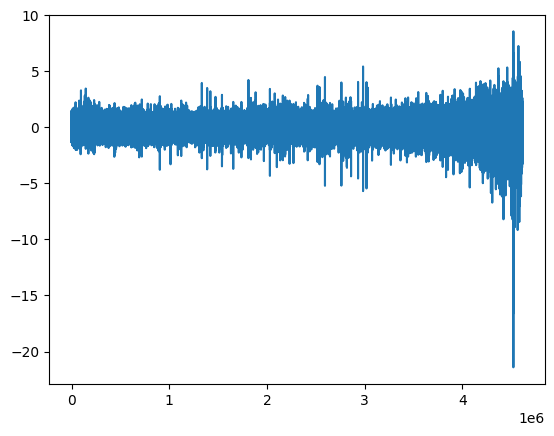

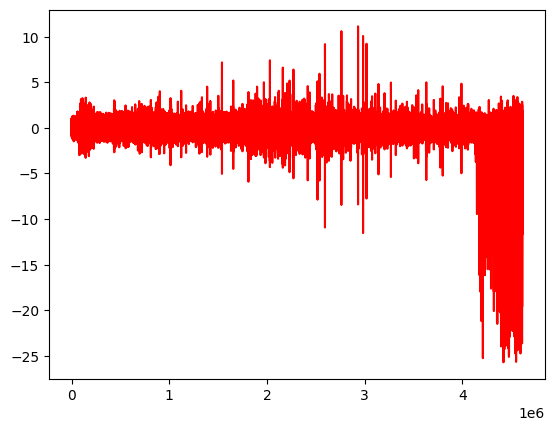

In [9]:
plt.plot(range(no_of_rows), df['horiz accel'])
plt.show()
plt.plot(range(no_of_rows), df['vert accel'], 'r')
plt.show()

**(1)signal processing = Extracting Time-Frequency Domain feature images**

when processing(= working with, preparing) a 1D signal with CNNs, the 1D signal is usually mapped to a 2D space (i.e. a 1D signal can be converted into 2D feature maps , static feature maps , or time-frequency features). Then, these 2D features are input into the conventional 2D CNNs for further processing(=preparing, working).

here features = horiz accel feature images and vert accel feature images.


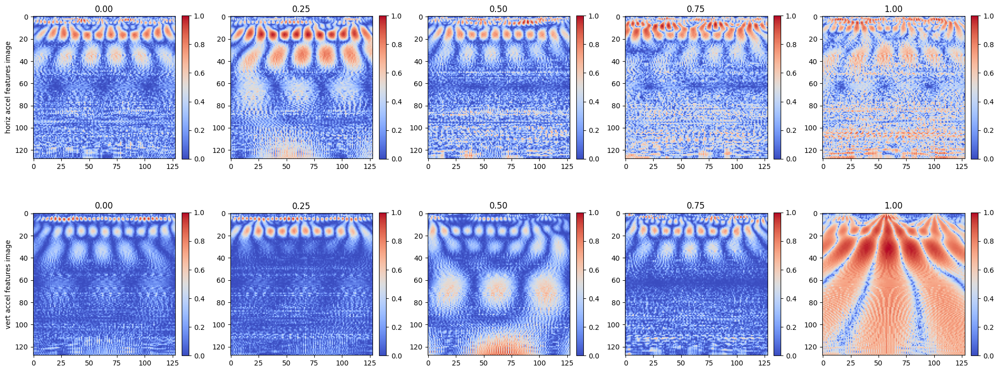

In [10]:
'''
plotting (= sketching, charting, blueprint, painting) diagrams 

here, diagrams => horiz accel feature images and vert accel feature images

both horiz accel and vert accel are vibration signals
'''
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')
'''
dividing the feature images into 5 samples
'''
for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)


  #extracting and plotting horizontal acceleration feature images (horiz accel feature images) for 5 samples (0.00, 0.25, 0.50, 0.75, 1.00).
  #horiz accel => horizontal acceleration vibration signal

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

  
  #extracting and plotting vertical acceleration feature images (vert accel feature images) for 5 samples (0.00, 0.25, 0.50, 0.75, 1.00). 
  #vert accel => vertical acceleration vibration signal
  
    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)
  
'''
The tight_layout() function in pyplot module of matplotlib library is used to automatically adjust subplot parameters to give specified padding.
padding = adding space (adding required white space)
'''
plt.tight_layout()
'''
The show() function in pyplot module of matplotlib library is used to display all figures.
'''
plt.show()

**extracting 2D feature images for each data file in Bearing1_3 and converting into numpy array**

Basically storing the no. of 2D CWT horiz accel vibration features and vert accel vibration features in numpy array

In [11]:
'''
created dictionary named data with key x. x key referred to an empty list.

extracted(= derived, calculated, taken out)horiz accel features from file 0 to file 1801(1802 total files) and stored in coef_h
extracted(= derived, calculated, taken out)vert accel features from file 0 to file 1801(1802 total files) and stored in coef_v

created x_ variable to store the array(numpy array) of list of horiz accel feature values and vert accel feature values from file 0 to file 1801 (1802 total
files)

using append method added x_ variable values to the data dictionary with x key (i.e. data['x']). In data dictionary, x key represents an empty list
therefore values of x_ variable added at the end of x empty list.

after appending, in data['x'] we stored the array of data['x'] values, Therefore, data['x'] becomes numpy array
array = collection of similar types of values

with assert keyword, if the condition returns true, then nothing happens. (or) If the condition returns true, then that condition will be displayed 
or printed as it is. If the condition returns false, then an AssertionError is raised. The keyword assert functionality is somewhat similar to if condition.

shape => https://www.w3schools.com/python/numpy/numpy_array_shape.asp

Here, no_of_files = 1802 (bearing1_3 contains total 1802 files), 2 = represents no. of channels or no. of filters 
128, 128 = represents pixels (i.e. 128 x 128 pixels) Pixel => short form for picture element. 128 x 128 = height x width
since the above condition is true, we printed no_of_files, shape of data['x']
data['x'].shape gives = no. of horiz accel & vert accel feature elements in array, no. of filters, and each feature image size (i,e. no. of pixels(128 x 128)) 
as an ouptut.
shape in python displays output in tuple format.
The shape of an array is the number of elements in each dimension.
data['x'] array contains 4 dimensions
basically, computer stores an image in 0's and 1's.
128 x 128 pixels => represents that each feature image is divided into 128 small parts(i.e. each image is represented as 128 rows and 128 columnns with
0's and 1's)
'''
data = {'x': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    data['x'].append(x_)
data['x']=np.array(data['x'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape)

1802 (1802, 2, 128, 128)


**Saving as pickle files(.pkz files)**

In [12]:
'''
saving data of bearing1_3 as pickle(.pkz) file.

The pickle(.pkz) file is created using Python pickle and the dump() method and is loaded (=started, activated) using Python pickle and the load() method.
we imported(=send) pickle module as pkl in the code. Therefore pkl.dump() is used to create pickle(.pkz) file and pkl.load() is used to load(=start, activate) 
pickle file.
pickle.dump() function => is used to store the object data(dump information) to the file. pickle.dump() function takes 3 arguments. The first argument is the
object that you want to store. The second argument is the file object you get by opening the desired file in write-binary (wb) mode. third argument is 
optional.

created out_file variable to store the data of Bearing1_3 as pickle(.pkz) file. file name => bearing1_3_test_data.pkz
main_dir variable => path where 6 bearing training datasets were saved in the pc or in the google drive.

with keyword => automatically releases memory after allocation. Whenever we open the file with open() function, it allocates some resources and memory to the 
file. And we should use close() function to release or delete that memory from the file otherwise errors will come. Sometimes we forget to close() the file
and we couldn’t find that we didn’t closed the file, so even the whole code is correct we might get errors and we may not be able to correct it. So it’s better
to use “with” keyword along with open() function as “with” keyword automatically releases or deletes memory after process completion.

The open() function opens a file in text format by default. To open a file in binary format, add 'b' to the mode parameter. Hence the "wb" mode opens the file 
in binary format for writing. Unlike text files, binary files are not human-readable.

as = The as keyword is used to create an alias (= aka, also known as, also called). In the below code, we create an alias f when opening the pkz_file, and 
now we can refer to the pkz_file (or we can access the pkz_file) by using f instead of pkz_file.

pkl.dump() creates file object named "f" and dumps(=stores) the data of data into "f" and saves "f" as bearing1_3_test_data.pkz in selected path 
(google drive)
'''
out_file = main_dir+'bearing1_3_test_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(data, f)

#Bearing1_4

Implementation is same as Bearing1_3

(1) Signal Processing = Extracting Time-Frequency Domain feature images

(2) Save as pickle(.pkz) files


In [ ]:
pkz_file=main_dir+'bearing1_4.pkz'
df=load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,8,8,0,425040.0,0.065,-0.058
1,8,8,0,425080.0,0.438,0.179
2,8,8,0,425120.0,-0.079,0.646
3,8,8,0,425160.0,-0.523,-0.411
4,8,8,0,425200.0,-0.146,-0.387


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

2915840 1139


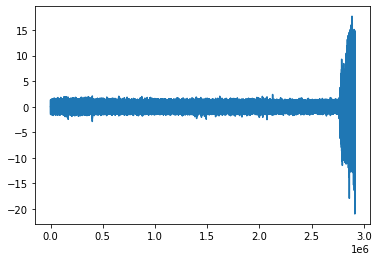

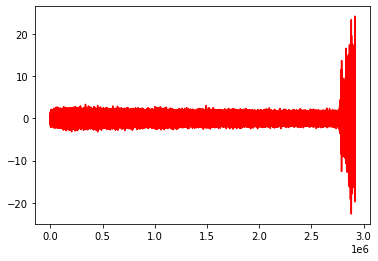

In [ ]:
plt.plot(range(no_of_rows), df['horiz accel'])
plt.show()
plt.plot(range(no_of_rows), df['vert accel'], 'r')
plt.show()

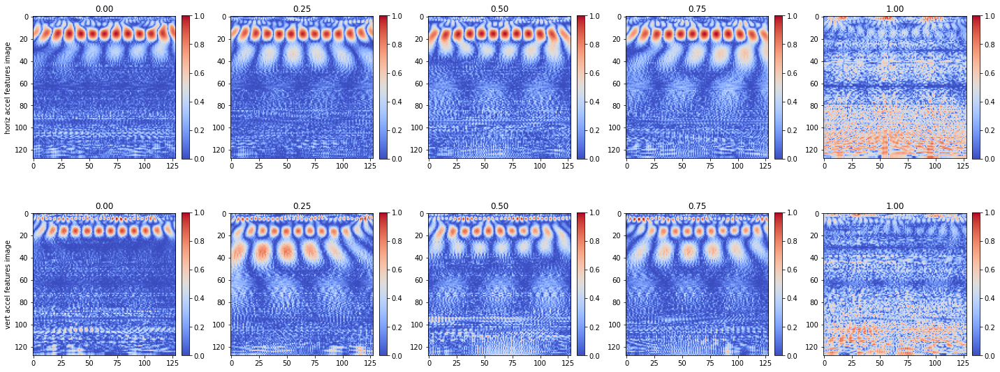

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    data['x'].append(x_)
data['x']=np.array(data['x'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape)

1139 (1139, 2, 128, 128)


In [ ]:
out_file = main_dir+'bearing1_4_test_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(data, f)

#Bearing1_5

Implementation is same as Bearing1_3, Bearing1_4

(1) Signal Processing = Extracting Time-Frequency Domain feature images

(2) Save as pickle(.pkz) files

In [ ]:
pkz_file=main_dir+'bearing1_5.pkz'
df=load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,9,20,24,212540.0,0.211,0.281
1,9,20,24,212580.0,0.268,-0.206
2,9,20,24,212620.0,0.306,-0.444
3,9,20,24,212660.0,0.226,0.111
4,9,20,24,212700.0,-0.025,0.077


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

5893120 2302


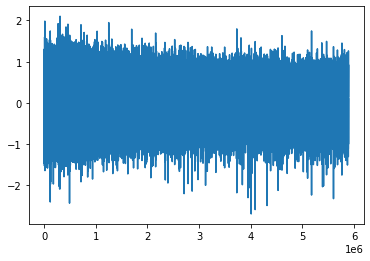

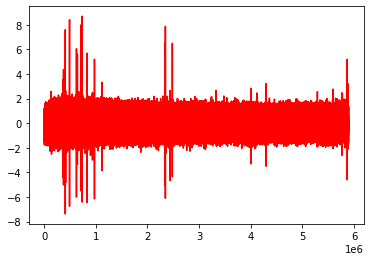

In [ ]:
plt.plot(range(no_of_rows), df['horiz accel'])
plt.show()
plt.plot(range(no_of_rows), df['vert accel'], 'r')
plt.show()

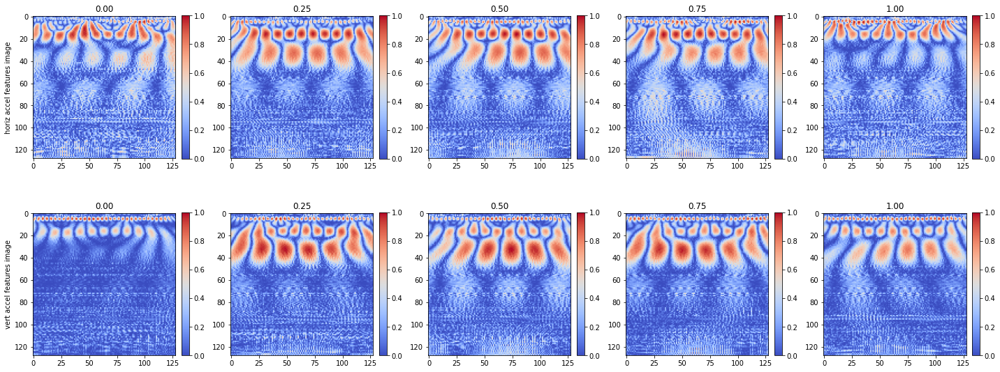

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    data['x'].append(x_)
data['x']=np.array(data['x'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape)

2302 (2302, 2, 128, 128)


In [ ]:
out_file = main_dir+'bearing1_5_test_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(data, f)

#Bearing1_6

Implementation is same as Bearing1_3, Bearing1_4, Bearing1_5

(1) Signal Processing = Extracting Time-Frequency Domain feature images

(2) Save as pickle(.pkz) files

In [ ]:
pkz_file=main_dir+'bearing1_6.pkz'
df=load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,9,2,51,775040.0,-0.070,-0.354
1,9,2,51,775080.0,-0.571,-0.036
2,9,2,51,775120.0,-0.660,0.413
3,9,2,51,775160.0,-0.498,-0.043
4,9,2,51,775200.0,-0.749,-0.354


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

5893120 2302


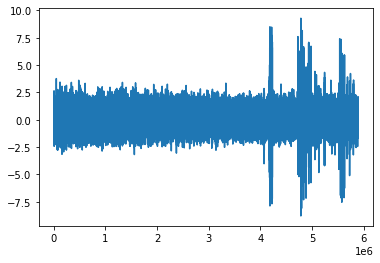

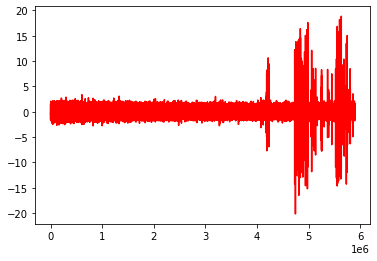

In [ ]:
plt.plot(range(no_of_rows), df['horiz accel'])
plt.show()
plt.plot(range(no_of_rows), df['vert accel'], 'r')
plt.show()

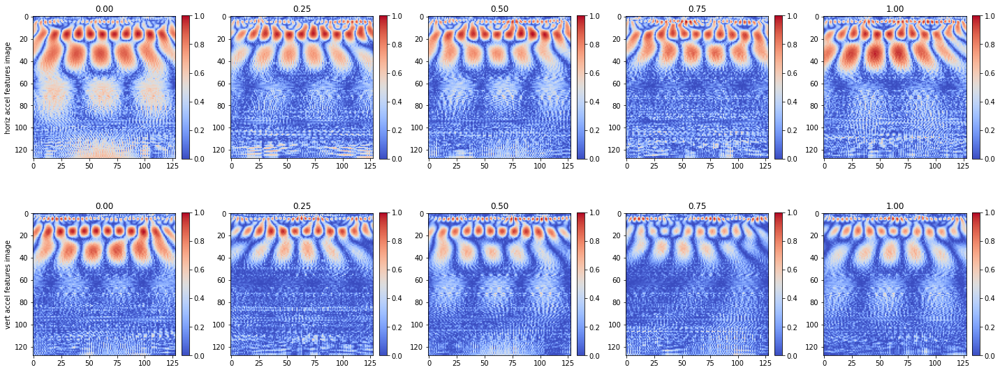

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    data['x'].append(x_)
data['x']=np.array(data['x'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape)

2302 (2302, 2, 128, 128)


In [ ]:
out_file = main_dir+'bearing1_6_test_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(data, f)

#Bearing1_7

Implementation is same as Bearing1_3, Bearing1_4, Bearing1_5, Bearing1_6

(1) Signal Processing = Extracting Time-Frequency Domain feature images

(2) Save as pickle(.pkz) files

In [ ]:
pkz_file=main_dir+'bearing1_7.pkz'
df=load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,8,2,37,962540.0,0.558,0.066
1,8,2,37,962580.0,0.373,-0.333
2,8,2,37,962620.0,0.558,-0.414
3,8,2,37,962660.0,0.465,0.180
4,8,2,37,962700.0,0.236,0.413


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

3845120 1502


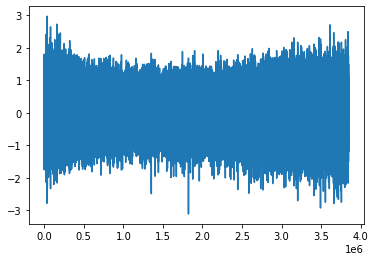

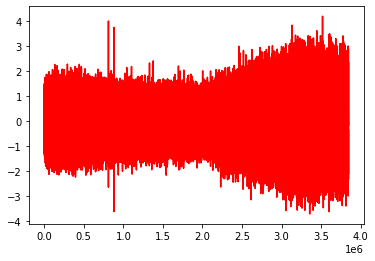

In [ ]:
plt.plot(range(no_of_rows), df['horiz accel'])
plt.show()
plt.plot(range(no_of_rows), df['vert accel'], 'r')
plt.show()

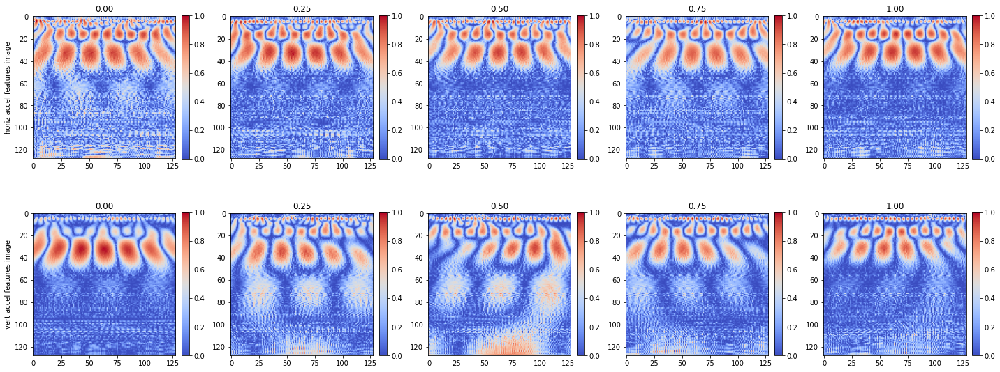

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    data['x'].append(x_)
data['x']=np.array(data['x'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape)

1502 (1502, 2, 128, 128)


In [ ]:
out_file = main_dir+'bearing1_7_test_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(data, f)

#Bearing2_3

Implementation is same as Bearing1_3, Bearing1_4, Bearing1_5, Bearing1_6, Bearing1_7

(1) Signal Processing = Extracting Time-Frequency Domain feature images

(2) Save as pickle(.pkz) files

In [ ]:
pkz_file=main_dir+'bearing2_3.pkz'
df=load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,8,39,57,571910.0,0.176,-0.133
1,8,39,57,571950.0,0.126,0.064
2,8,39,57,571990.0,-0.178,0.396
3,8,39,57,572030.0,-0.341,0.126
4,8,39,57,572070.0,-0.052,-0.243


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

3077120 1202


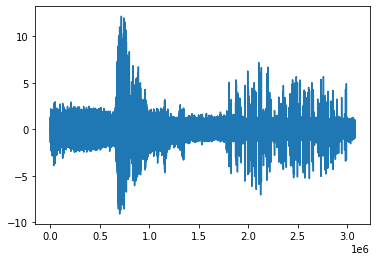

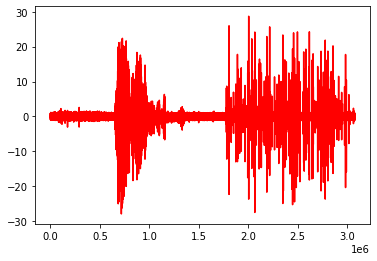

In [ ]:
plt.plot(range(no_of_rows), df['horiz accel'])
plt.show()
plt.plot(range(no_of_rows), df['vert accel'], 'r')
plt.show()

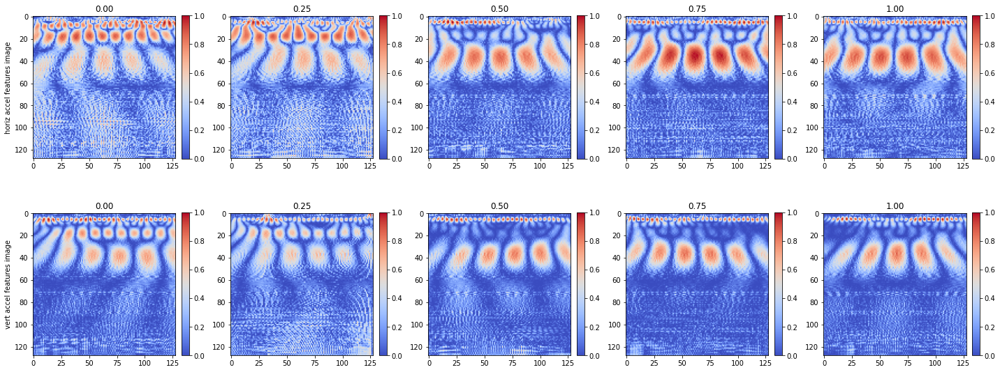

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    data['x'].append(x_)
data['x']=np.array(data['x'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape)

1202 (1202, 2, 128, 128)


In [ ]:
out_file = main_dir+'bearing2_3_test_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(data, f)

#Bearing2_4

Implementation is same as Bearing1_3, Bearing1_4, Bearing1_5, Bearing1_6, Bearing1_7, Bearing2_3

(1) Signal Processing = Extracting Time-Frequency Domain feature images

(2) Save as pickle(.pkz) files

In [ ]:
pkz_file=main_dir+'bearing2_4.pkz'
df=load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,8,3,36,462540.0,-0.088,0.128
1,8,3,36,462580.0,-0.178,0.137
2,8,3,36,462620.0,-0.323,0.177
3,8,3,36,462660.0,0.183,0.032
4,8,3,36,462700.0,0.562,-0.471


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

1566720 612


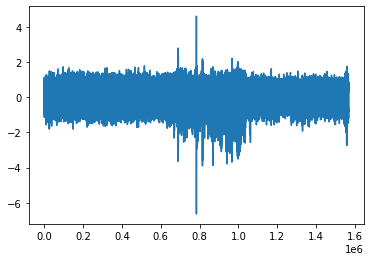

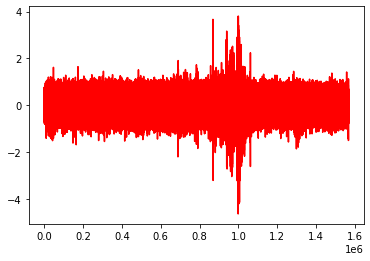

In [ ]:
plt.plot(range(no_of_rows), df['horiz accel'])
plt.show()
plt.plot(range(no_of_rows), df['vert accel'], 'r')
plt.show()

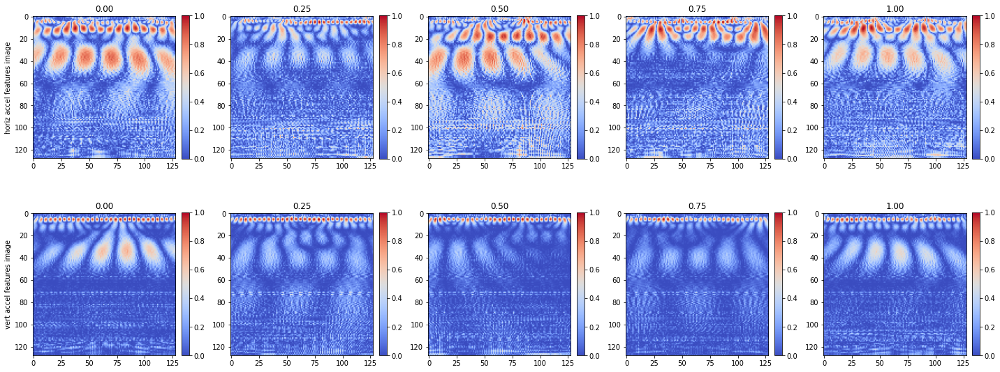

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    data['x'].append(x_)
data['x']=np.array(data['x'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape)

612 (612, 2, 128, 128)


In [ ]:
out_file = main_dir+'bearing2_4_test_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(data, f)

#Bearing2_5

Implementation is same as Bearing1_3, Bearing1_4, Bearing1_5, Bearing1_6, Bearing1_7, Bearing2_3, Bearing2_4

(1) Signal Processing = Extracting Time-Frequency Domain feature images

(2) Save as pickle(.pkz) files

In [ ]:
pkz_file=main_dir+'bearing2_5.pkz'
df=load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,8,37,46,150040.0,0.441,-0.018
1,8,37,46,150080.0,0.148,0.208
2,8,37,46,150120.0,-0.042,-0.124
3,8,37,46,150160.0,-0.489,0.032
4,8,37,46,150200.0,-0.385,-0.373


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

5125120 2002


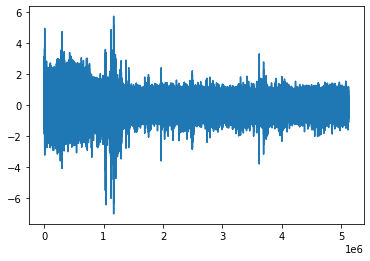

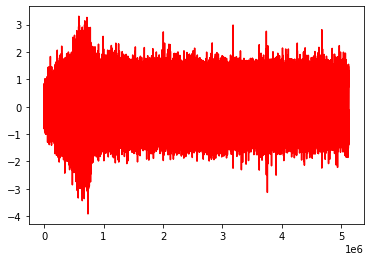

In [ ]:
plt.plot(range(no_of_rows), df['horiz accel'])
plt.show()
plt.plot(range(no_of_rows), df['vert accel'], 'r')
plt.show()

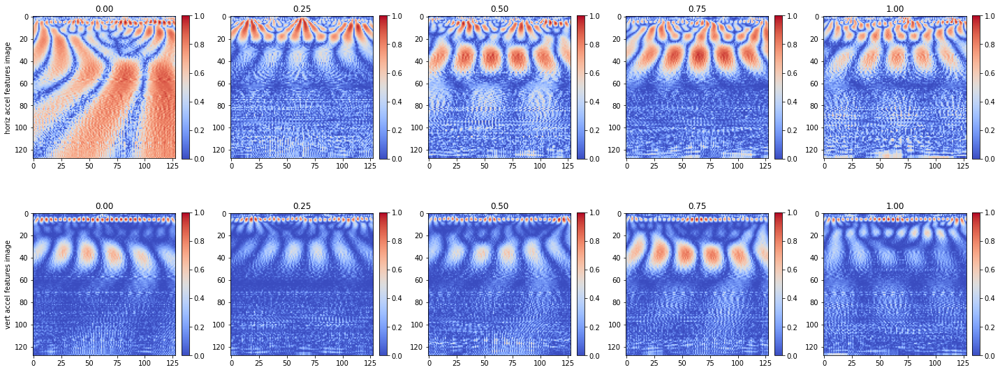

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    data['x'].append(x_)
data['x']=np.array(data['x'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape)

2002 (2002, 2, 128, 128)


In [ ]:
out_file = main_dir+'bearing2_5_test_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(data, f)

#Bearing2_6

Implementation is same as Bearing1_3, Bearing1_4, Bearing1_5, Bearing1_6, Bearing1_7, Bearing2_3, Bearing2_4, Bearing2_5

(1) Signal Processing = Extracting Time-Frequency Domain feature images

(2) Save as pickle(.pkz) files

In [ ]:
pkz_file=main_dir+'bearing2_6.pkz'
df=load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,8,52,11,618790.0,0.321,0.170
1,8,52,11,618830.0,-0.030,-0.542
2,8,52,11,618870.0,-0.382,0.027
3,8,52,11,618910.0,-0.294,0.319
4,8,52,11,618940.0,-0.033,0.485


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

1464320 572


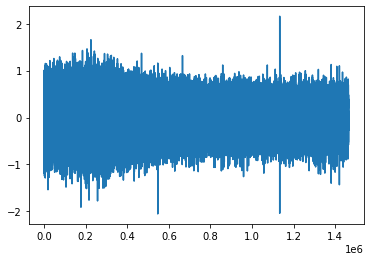

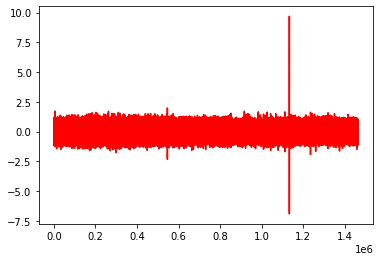

In [ ]:
plt.plot(range(no_of_rows), df['horiz accel'])
plt.show()
plt.plot(range(no_of_rows), df['vert accel'], 'r')
plt.show()

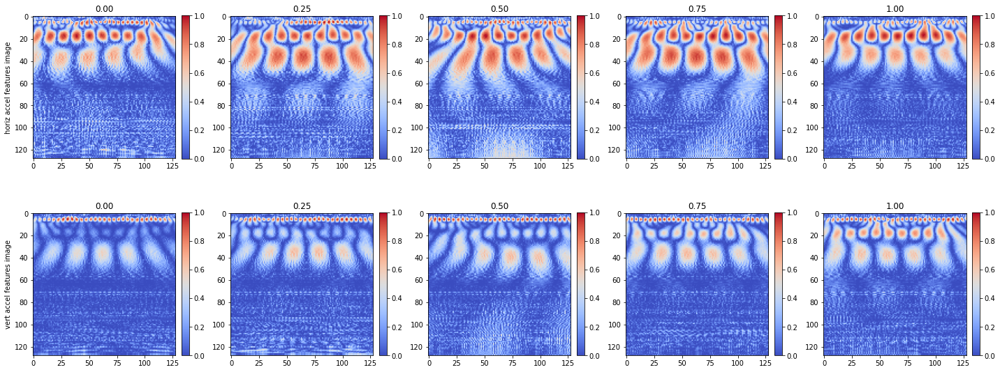

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    data['x'].append(x_)
data['x']=np.array(data['x'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape)

572 (572, 2, 128, 128)


In [ ]:
out_file = main_dir+'bearing2_6_test_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(data, f)

#Bearing2_7

Implementation is same as Bearing1_3, Bearing1_4, Bearing1_5, Bearing1_6, Bearing1_7, Bearing2_3, Bearing2_4, Bearing2_5, Bearing2_6

(1) Signal Processing = Extracting Time-Frequency Domain feature images

(2) Save as pickle(.pkz) files

In [ ]:
pkz_file=main_dir+'bearing2_7.pkz'
df=load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,8,40,25,150040.0,0.613,0.188
1,8,40,25,150080.0,0.680,-0.213
2,8,40,25,150120.0,0.073,-0.186
3,8,40,25,150160.0,-0.673,0.305
4,8,40,25,150200.0,-0.602,0.303


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

440320 172


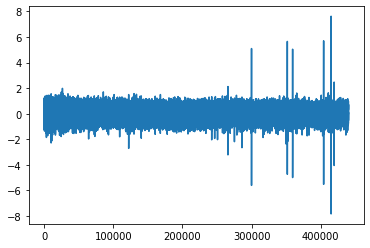

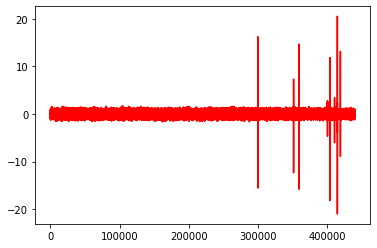

In [ ]:
plt.plot(range(no_of_rows), df['horiz accel'])
plt.show()
plt.plot(range(no_of_rows), df['vert accel'], 'r')
plt.show()

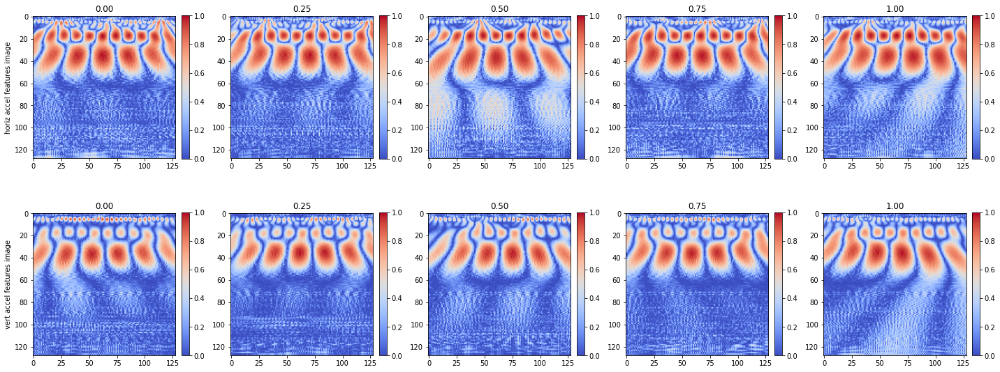

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    data['x'].append(x_)
data['x']=np.array(data['x'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape)

172 (172, 2, 128, 128)


In [ ]:
out_file = main_dir+'bearing2_7_test_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(data, f)

#Bearing3_3

Implementation is same as Bearing1_3, Bearing1_4, Bearing1_5, Bearing1_6, Bearing1_7, Bearing2_3, Bearing2_4, Bearing2_5, Bearing2_6, Bearing2_7

(1) Signal Processing = Extracting Time-Frequency Domain feature images

(2) Save as pickle(.pkz) files

In [ ]:
pkz_file=main_dir+'bearing3_3.pkz'
df=load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,8,27,33,212540.0,-0.043,-0.084
1,8,27,33,212580.0,-0.321,0.196
2,8,27,33,212620.0,-0.224,0.332
3,8,27,33,212660.0,0.110,-0.189
4,8,27,33,212700.0,0.157,-0.426


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

901120 352


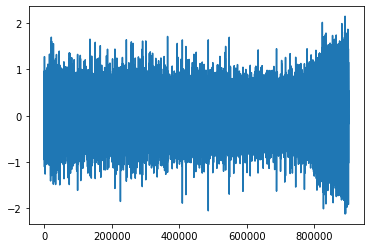

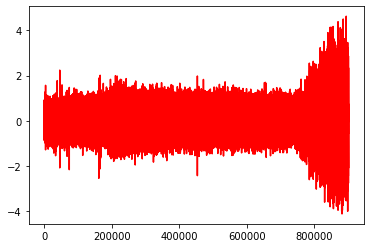

In [ ]:
plt.plot(range(no_of_rows), df['horiz accel'])
plt.show()
plt.plot(range(no_of_rows), df['vert accel'], 'r')
plt.show()

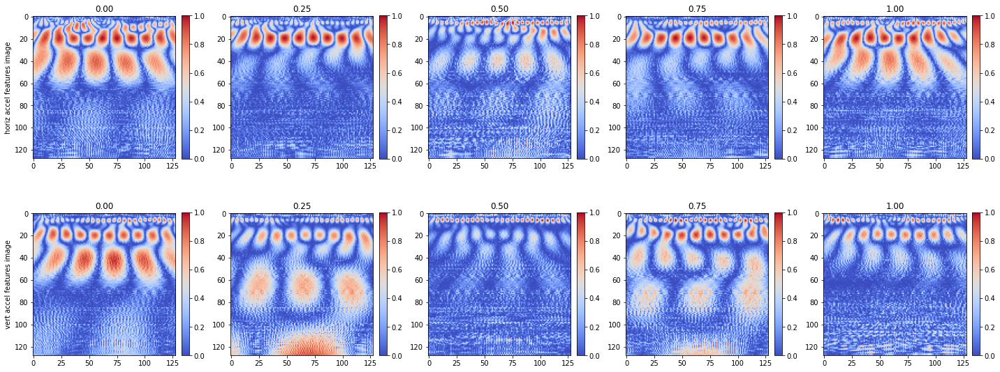

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    data['x'].append(x_)
data['x']=np.array(data['x'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape)

352 (352, 2, 128, 128)


In [ ]:
out_file = main_dir+'bearing3_3_test_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(data, f)